In [27]:
import pandas as pd 
import IPython
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import math
import re

In [28]:
IPython.display.Audio("AWindowtothePast.mp3")

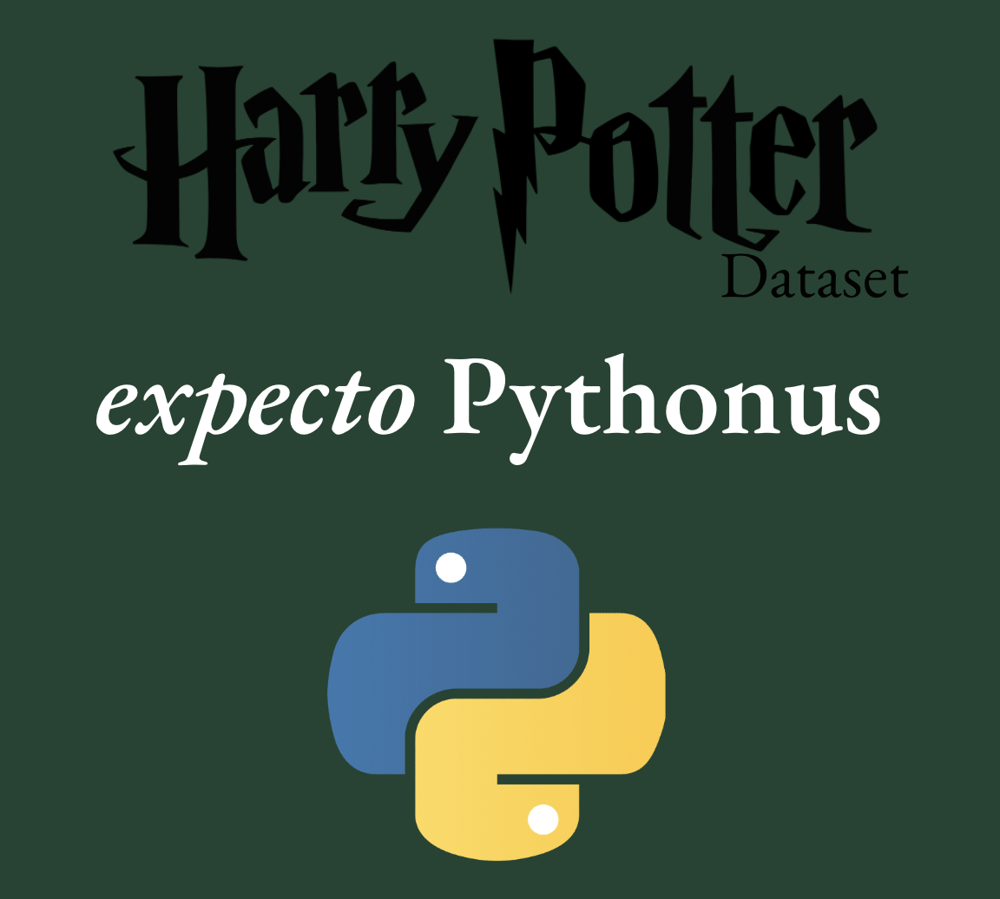

In [29]:
characters = pd.read_csv('Characters.csv',delimiter=';', encoding = "ISO-8859-1")
characters.head()


,ï»¿Id,Name,Gender,Job,House,Wand,Patronus,Species,Blood status,Hair colour,Eye colour,Loyalty,Skills,Birth,Death
0,1,Harry James Potter,Male,Student,Gryffindor,"11"" Holly phoenix feather",Stag,Human,Half-blood,Black,Bright green,Albus Dumbledore | Dumbledore's Army | Order o...,Parseltongue| Defence Against the Dark Arts | ...,31 July 1980,NaN
1,2,Ronald Bilius Weasley,Male,Student,Gryffindor,"12"" Ash unicorn tail hair",Jack Russell terrier,Human,Pure-blood,Red,Blue,Dumbledore's Army | Order of the Phoenix | Hog...,Wizard chess | Quidditch goalkeeping,1 March 1980,NaN
2,3,Hermione Jean Granger,Female,Student,Gryffindor,"10Â¾"" vine wood dragon heartstring",Otter,Human,Muggle-born,Brown,Brown,Dumbledore's Army | Order of the Phoenix | Hog...,Almost everything,"19 September,Â 1979",NaN
3,4,Albus Percival Wulfric Brian Dumbledore,Male,Headmaster,Gryffindor,"15"" Elder Thestral tail hair core",Phoenix,Human,Half-blood,Silver| formerly auburn,Blue,Dumbledore's Army | Order of the Phoenix | Hog...,Considered by many to be one of the most power...,Late August 1881,"30 June,Â 1997Â"
4,5,Rubeus Hagrid,Male,Keeper of Keys and Grounds | Professor of Care...,Gryffindor,"16"" Oak unknown core",None,Half-Human/Half-Giant,Part-HumanÂ (Half-giant),Black,Black,Albus Dumbledore | Order of the Phoenix | Hogw...,Resistant to stunning spells| above average st...,6 DecemberÂ 1928,NaN


In [5]:
potions = pd.read_csv('Potions.csv',delimiter=';', encoding = "ISO-8859-1")
potions.head()

,ï»¿Name,Known ingredients,Effect,Characteristics,Difficulty level
0,Ageing Potion,"Newt spleens , Bananas",Ages drinker temporarily,Green,Advanced
1,Amortentia,NaN,Love PotionÂ that causes a powerful infatuatio...,"Mother-of-pearl sheen, Spiralling steam, Scent...",Advanced
2,Antidote to Veritaserum,NaN,Counters the effect ofÂ Veritaserum,NaN,NaN
3,Babbling Beverage,"Valerian sprigs, Aconite, Dittany",Causes the drinker to speak nonsense,NaN,NaN
4,Baruffio's Brain Elixir,"Leaping Toadstools, Frog Brains, Runespoor egg...",Allegedly increases one's brain power,Green in colour,NaN


In [6]:
spells = pd.read_csv('Spells.csv',delimiter=';', encoding = "ISO-8859-1")
spells.head()

,ï»¿Name,Incantation,Type,Effect,Light
0,Summoning Charm,Accio,Charm,Summons an object,None
1,Age Line,Unknown,Charm,Prevents people above or below a certain age f...,Blue
2,Water-Making Spell,Aguamenti,"Charm, Conjuration",ConjuresÂ water,Icy blue
3,Launch an object up into the air,Alarte Ascendare,Charm,Rockets target upward,Red
4,Albus Dumbledore's Forceful Spell,Unknown,Spell,Great Force,None


In [7]:
hp1 = pd.read_csv('HP1.csv',delimiter=';', encoding = "ISO-8859-1")
hp1.head()

,ï»¿Character,Sentence
0,Dumbledore,"I should've known that you would be here, Prof..."
1,McGonagall,"Good evening, Professor Dumbledore."
2,McGonagall,"Are the rumors true, Albus?"
3,Dumbledore,"I'm afraid so, professor."
4,Dumbledore,The good and the bad.


In [8]:
hp2 = pd.read_csv('HP2.csv',delimiter=';', encoding = "ISO-8859-1")
hp2.head()

,ï»¿Character,Sentence
0,HARRY,"I canât let you out, Hedwig."
1,HARRY,Iâm not allowed to use magic outside of scho...
2,HARRY,"Besides, if Uncle Vernonâ¦"
3,VERNON,Harry Potter!
4,HARRY,Now youâve done it.


In [9]:
hp3 = pd.read_csv('HP3.csv',delimiter=';', encoding = "ISO-8859-1")
hp3.head()

,ï»¿CHARACTER,SENTENCE
0,HARRY,Lumos Maxima...
1,HARRY,Lumos Maxima...
2,HARRY,Lumos Maxima...
3,HARRY,Lumos... MAXIMA!
4,AUNT PETUNIA,Harry! Harry!


In [10]:
reviews = pd.read_csv('reviews.csv')
reviews.head()

,Unnamed: 0,book,name,date,rating,likes,description,stars_given
0,0,Harry Potter and the Sorcerer's Stone,MirandaReads,"Nov11,2019",itwasamazing,1657 likes,Stuck at home? Got some time on your hands? Wa...,5.0
1,1,Harry Potter and the Sorcerer's Stone,Kai,"Apr02,2015",NaN,993 likes,Let's do this thing where we promote and recom...,NaN
2,2,Harry Potter and the Sorcerer's Stone,Lora,"Jun03,2011",itwasamazing,1599 likes,I'm going to keep this brief since there isn't...,5.0
3,3,Harry Potter and the Sorcerer's Stone,★Jess,"Dec10,2009",itwasamazing,831 likes,My original review was a comparison of sorts b...,5.0
4,4,Harry Potter and the Sorcerer's Stone,Matthew,"Jan08,2013",itwasamazing,911 likes,One of my first jobs was at a bookstore. When ...,5.0


In [11]:
horrocruxes = pd.read_csv('horrocruxes.csv')
horrocruxes.head(10)

,id,killer,horrocrux,weapon,hiding place,soul porcentage
0,1,Harry Potter,Tom Riddle's Diary,basilisk's fang,Malfoy Manor,50.0
1,2,Albus Dumbledore,Marvolo Gaunt's Ring,Sword of Gryffindor,Gaunt Shack,25.0
2,3,Ron Weasley,Slytherin's Locket,Sword of Gryffindor,The Cave,12.5
3,4,Hermione Granger,Helga Hufflepuff's cup,basilisk's fang,Lestrange Vault,6.2
4,5,Vincent Crabbe,Rowena Ravenclaw's diadem,Fiendfyre,Room of Requirement,3.1
5,6,Voldemort,Harry Potter,Avada Kedavra,Harry Potter,1.5
6,7,Neville Longbottom,Nagini,Sword of Gryffindor,Protection orb,0.7
7,8,Harry Potter,Voldemort,Avada Kedavra,Voldemort,0.7


# Characters análisis

In [12]:
characters.shape

(140, 15)

### Casas y otras escuelas

In [13]:

characters.House.unique()

array(['Gryffindor', 'Ravenclaw', 'Slytherin', nan, 'Hufflepuff',
       'Beauxbatons Academy of Magic', 'Durmstrang Institute'],
      dtype=object)

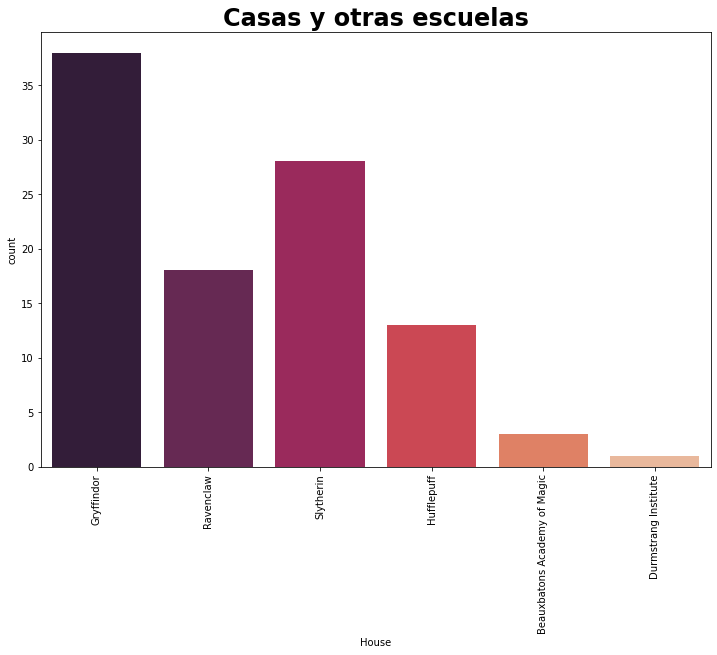

In [14]:
fig = plt.figure(figsize=(12,8))
axes = plt.plot()
axes =  sns.countplot(x='House',data=characters,palette="rocket")
axes.set_title('Casas y otras escuelas',fontsize=24,fontweight="bold")
plt.xticks(rotation=90);

### Blood status 

In [15]:
#Blood status
characters['Blood status'].unique()

array(['Half-blood', 'Pure-blood', 'Muggle-born',
       'Part-HumanÂ\xa0(Half-giant)', 'Half-bloodÂ\xa0orÂ\xa0pure-blood',
       'Pure-bloodÂ\xa0orÂ\xa0half-blood',
       'Pure-bloodÂ\xa0orÂ\xa0Half-blood', 'Unknown', 'Part-Goblin',
       'Muggle-bornÂ\xa0orÂ\xa0half-blood[', nan,
       'Pure-blood or half-blood', 'Quarter-Veela', 'Half-blood[',
       'Muggle', 'Squib'], dtype=object)

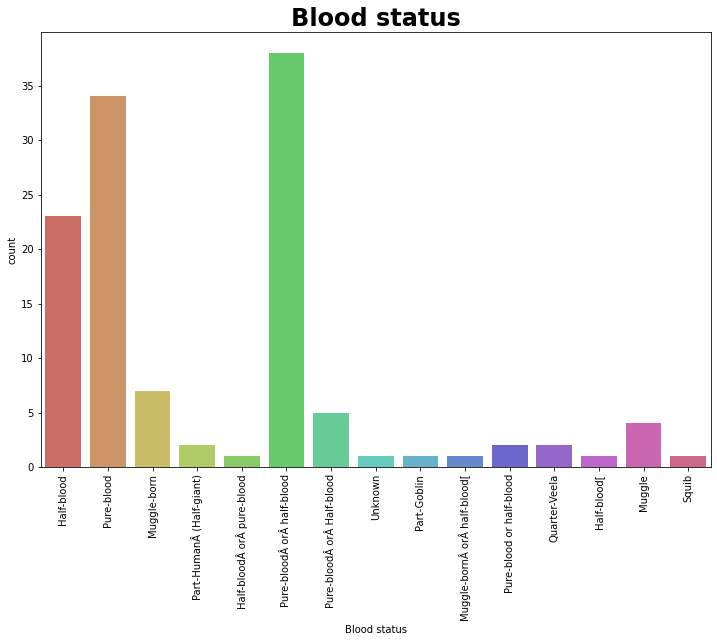

In [16]:

fig = plt.figure(figsize=(12,8))
axes = plt.plot()
axes =  sns.countplot(x='Blood status',data=characters,palette="hls")
axes.set_title('Blood status',fontsize=24,fontweight="bold")
plt.xticks(rotation=90);

In [17]:
#Blood status / house graph
characters[['House', 'Blood status']] = characters[['House', 'Blood status']].fillna('NA')
mod_char=characters.loc[characters['Blood status'] != 'NA']
mod_char=mod_char[mod_char['Blood status'] != 'Muggle']
mod_char = mod_char.loc[mod_char['House']!='NA']


In [18]:
fig = px.bar(mod_char[['House','Blood status']].sort_values('Blood status', ascending=False), 
                        y = "Blood status", x= "House", color='Blood status',template='plotly_dark')
fig.update_xaxes(tickangle=270, tickfont=dict(family='Rockwell', size=14))
fig.update_layout(title_text="Blood status - casa o escuela")
fig.show()

In [19]:
#Blood status order of the pheonix

characters['Loyalty']= characters['Loyalty'].astype('str')

In [20]:
#Blood status of death eaters

### Casas por familia notable 

In [21]:
#Houses of black, malfoy, potter, weasley family, 

potters = characters[characters['Name'].apply(lambda str:('Potter' in str))] 
blacks = characters[characters['Name'].apply(lambda str:('Black' in str))] 
malfoys = characters[characters['Name'].apply(lambda str:('Malfoy' in str))] 
weasleys = characters[characters['Name'].apply(lambda str:('Weasley' in str))] 

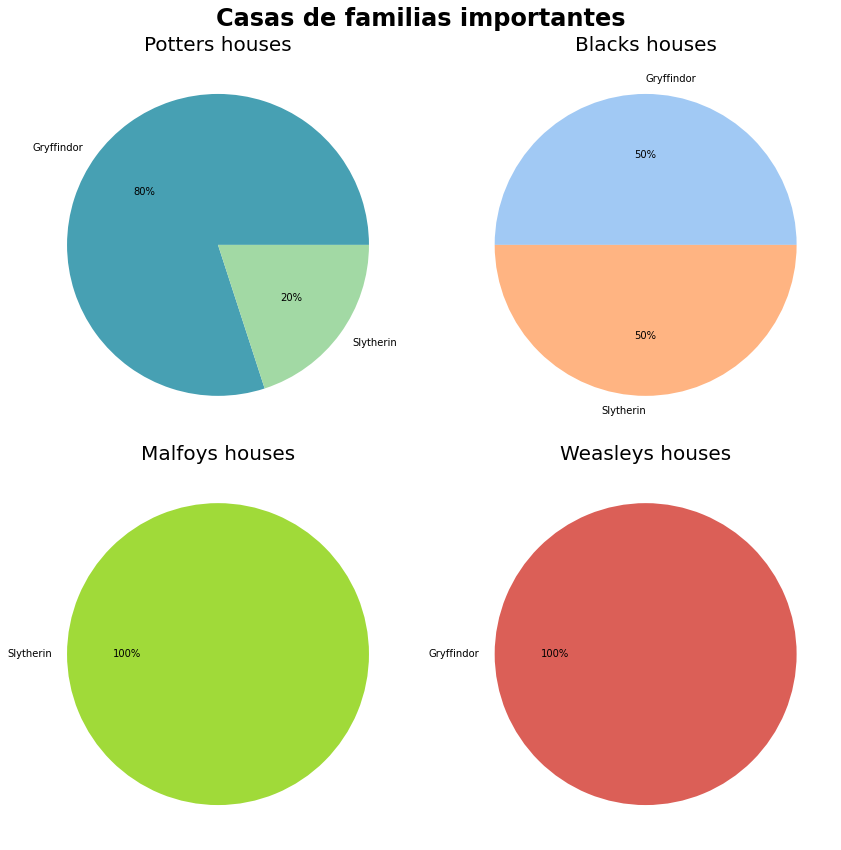

In [22]:

potters_houses = potters.groupby('House').size().to_frame('Count')
blacks_houses = blacks.groupby('House').size().to_frame('Count')
malfoys_houses = malfoys.groupby('House').size().to_frame('Count')
weasleys_houses = weasleys.groupby('House').size().to_frame('Count')

fig = plt.figure(figsize=(12,12))
fig.suptitle('Casas de familias importantes', fontsize=24, fontweight='bold')
axes1 = plt.subplot(2,2,1)
axes1 = plt.pie(potters_houses['Count'],labels = potters['House'].unique(),autopct="%.0f%%",colors=sns.color_palette("Spectral_r"))
plt.title('Potters houses',fontsize=20)


axes2 = plt.subplot(2,2,2)
axes2 = plt.pie(blacks_houses['Count'],labels = blacks['House'].unique(),autopct="%.0f%%",colors=sns.color_palette("pastel"))
plt.title('Blacks houses',fontsize=20)

axes3 = plt.subplot(2,2,3)
axes3 = plt.pie(malfoys_houses['Count'],labels = malfoys['House'].unique(),autopct="%.0f%%",colors=sns.color_palette("viridis_r"))
plt.title('Malfoys houses',fontsize=20)

axes4 = plt.subplot(2,2,4)
axes4 = plt.pie(weasleys_houses['Count'],labels = weasleys['House'].unique(),autopct="%.0f%%",colors=sns.color_palette("hls"))
plt.title('Weasleys houses',fontsize=20)
plt.tight_layout();




### Gender 

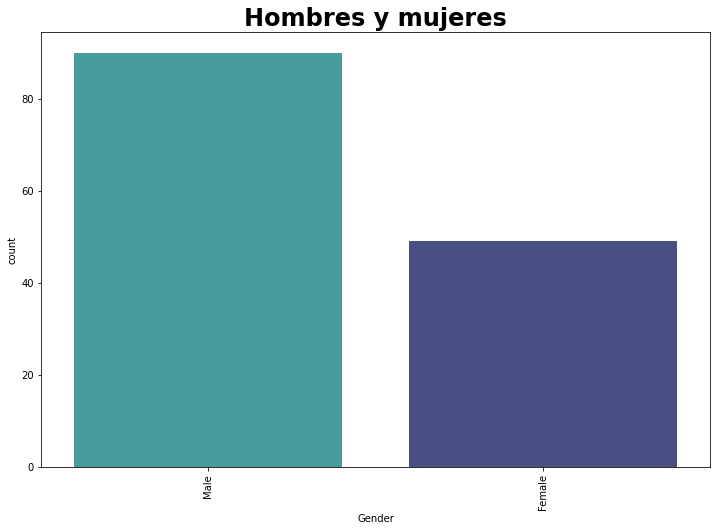

In [23]:
fig = plt.figure(figsize=(12,8))
axes = plt.plot()
axes =  sns.countplot(x='Gender',data=characters,palette="mako_r")
axes.set_title('Hombres y mujeres',fontsize=24,fontweight='bold')
plt.xticks(rotation=90);

### Wands 

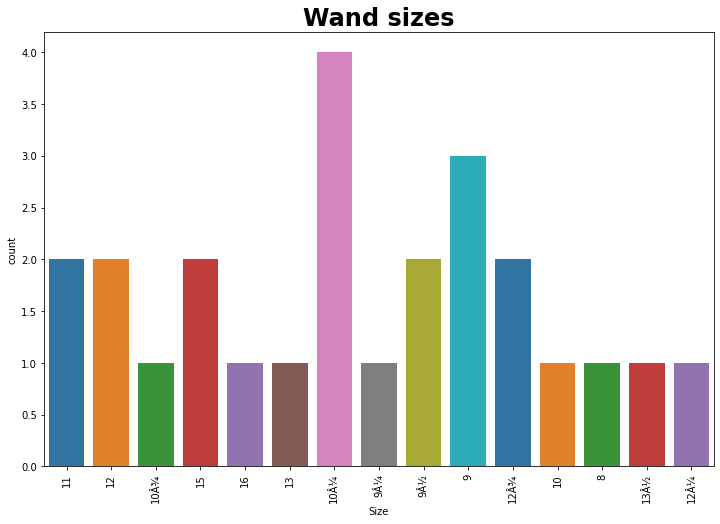

In [26]:
#By size 

wand = characters.loc[characters['Wand']!='Unknown']
wand = wand.loc[wand['Wand']!='Elm and dragon heartstring']
wand = wand.loc[wand['Wand']!='snakewood, Basilisk horn']
wand = wand.loc[wand['Name']!='Frank Longbottom']
wand = wand.Wand

wand = wand.dropna()
sizes = wand.str.split(' ').str.get(0)
sizes = sizes.str.split('"').str.get(0)
sizes = sizes.str.split(' ').str.get(0)
wand_sizes = []
for i in sizes:
    wand_sizes.append(i)
sizes = pd.DataFrame(wand_sizes) 
sizes.columns = ["Size"]

fig = plt.figure(figsize=(12,8))
axes = plt.plot()
axes =  sns.countplot(x='Size',data=sizes,palette="tab10")
axes.set_title('Wand sizes',fontsize=24,fontweight='bold')
plt.xticks(rotation=90);

In [36]:
#Type
wand = characters.Wand

wand = wand.dropna()
types = wand.str.split('"').str.get(1)
types = types.str.split(',').str.get(-1)
types = types.dropna()
wand_types = []
for i in types:
    wand_types.append(i)
types = pd.DataFrame(wand_types) 
types.columns = ["Type"]
types
# fig = plt.figure(figsize=(15,11))
# axes = plt.plot()
# axes =  sns.countplot(x='Type',data=types,palette="tab10")
# axes.set_title('Wand types',fontsize=24,fontweight='bold')
# plt.xticks(rotation=90);

,Type
0,Holly phoenix feather
1,Ash unicorn tail hair
2,vine wood dragon heartstring
3,Elder Thestral tail hair core
4,Oak unknown core
5,Cherry unicorn hair
6,Willow unknown core
7,Mahogany unknown core
8,Cypress unicorn hair
9,Chestnut dragon heartstring


### Patronus

Text(0.5, 1.0, 'Patronus')

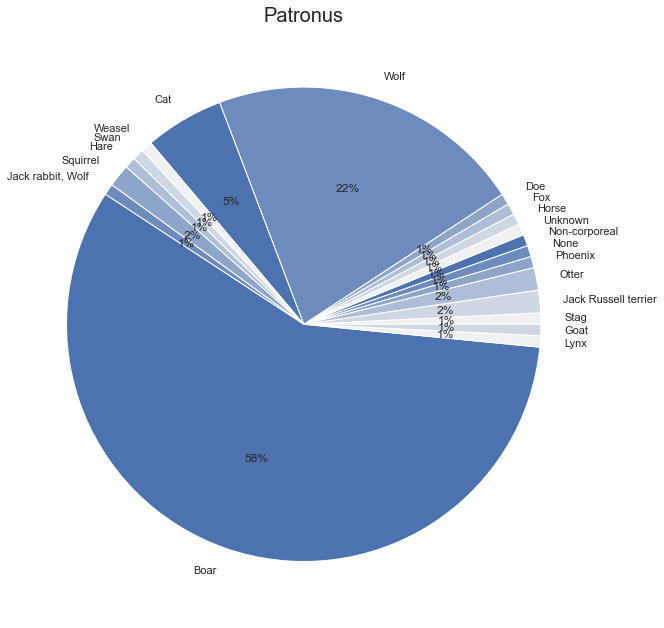

In [261]:
#Types

patronus = characters.Patronus.dropna()
patronus.colums = ['Patronus']
patronus_types = []
for i in patronus:
    patronus_types.append(i)
patronus = pd.DataFrame(patronus_types) 
patronus.columns = ["Patronus"]
patronus_count = patronus.groupby('Patronus').size().to_frame('Count')

fig = plt.figure(figsize=(24,24))
axes1 = plt.subplot(2,2,1)
axes1 = plt.pie(patronus_count['Count'],labels = patronus['Patronus'].unique(),autopct="%.0f%%",colors=sns.color_palette("light:b"))
plt.title('Patronus',fontsize=20)


### Species 

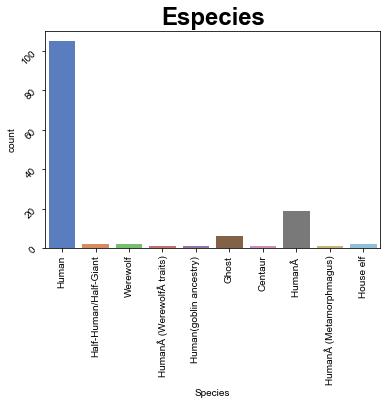

In [26]:
#Types

sns.countplot(x="Species",data=characters,palette="muted")
sns.set(rc={'figure.figsize':(14,14)})
plt.xticks(rotation=90)
plt.yticks(rotation=45)
plt.title("Especies",fontsize=24,fontweight="bold")
# changing the font size
sns.set(font_scale=1)

# Potions análisis

In [27]:
#By type

Text(0.5, 1.0, 'Potion difficulties')

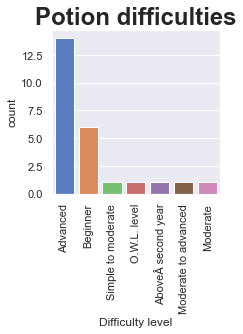

In [282]:
potions = pd.read_csv('Potions.csv',delimiter=';', encoding = "ISO-8859-1")

#Types

sns.countplot(x="Difficulty level",data=potions,palette="muted")
sns.set(rc={'figure.figsize':(3,3)})
plt.xticks(rotation=90)
plt.title("Potion difficulties",fontsize=24,fontweight="bold")


# Spells análisis

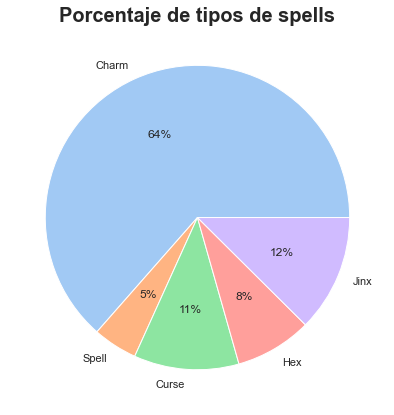

In [28]:
#By type 

types=["Charm","Spell","Curse","Hex","Jinx"]
count_types=[]
for i in types:
    count_types.append(spells[spells['Type']==i].shape[0])


fig = plt.figure(figsize=(7,7))
axes1 = plt.plot(2,2,1)
axes1 = plt.pie(count_types,labels = types,autopct="%.0f%%",colors=sns.color_palette("pastel"))
plt.title('Porcentaje de tipos de spells',fontsize=20,fontweight='bold');



In [29]:
#By effect keyword 
spells[spells['Effect'].apply(lambda str:('shield' in str.lower()))] 


,ï»¿Name,Incantation,Type,Effect,Light
99,Fianto Duri,Fianto Duri,Charm,Most likely hardens magical shields,Blueish white
217,Protego totalum,Protego totalum,Charm,Shields an area,None
246,Shield penetration spell,Unknown,Spell,Used to break down magical shields,Bluish-white


In [30]:
#Cuantas veces fue usado 

In [31]:
topSpells = pd.read_csv('topSpells.csv')
topSpells.head()

,id,spell,times used
0,1,Shield penetration spell,617
1,2,Dark mark counter-curse,467
2,3,Wingardium leviosa,229
3,4,Stupefy,217
4,5,Protego,147


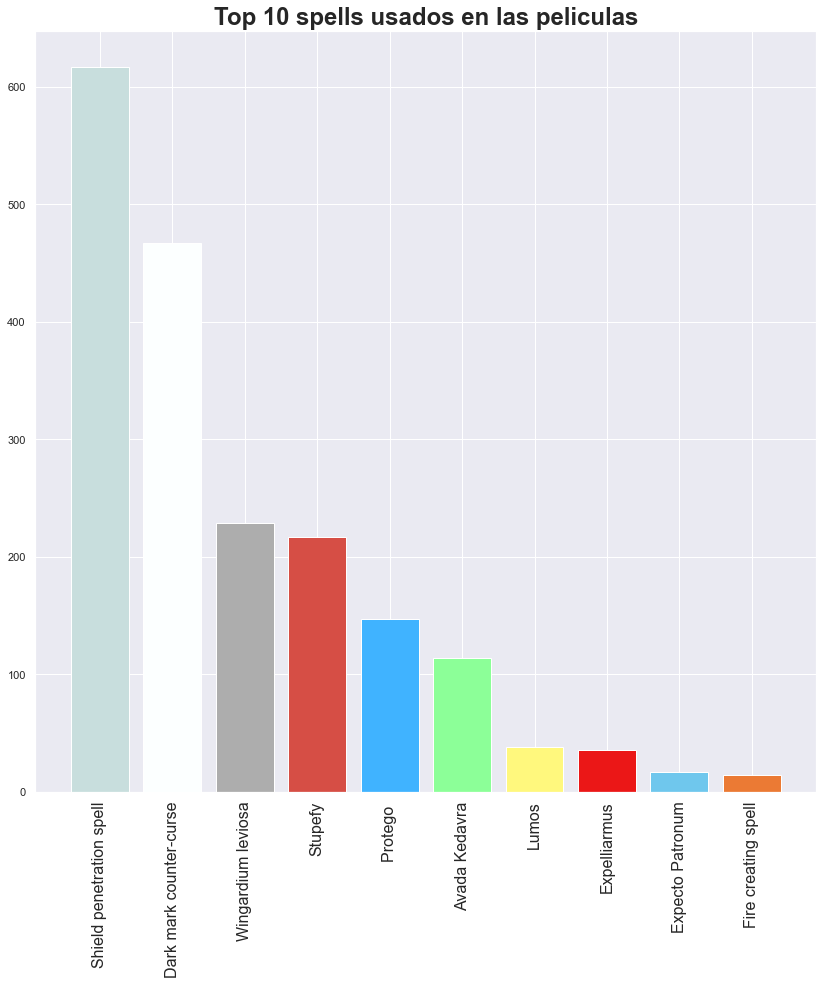

In [32]:
fig = plt.plot()
plt.style.use('dark_background')
plt.bar(x=topSpells['spell'],height=topSpells['times used'],
        color=["#c8dedd","#fcffff","#adadad","#d64e45","#40b3ff","#8cff98","#fff87d","#eb1717","#6fc7ed","#eb7a34"])
plt.title("Top 10 spells usados en las peliculas",fontsize=24,fontweight="bold")
plt.xticks(rotation=90,fontsize=16);

# Movie scripts 1,2,3

Text(0.5, 1.0, 'Movie 1')

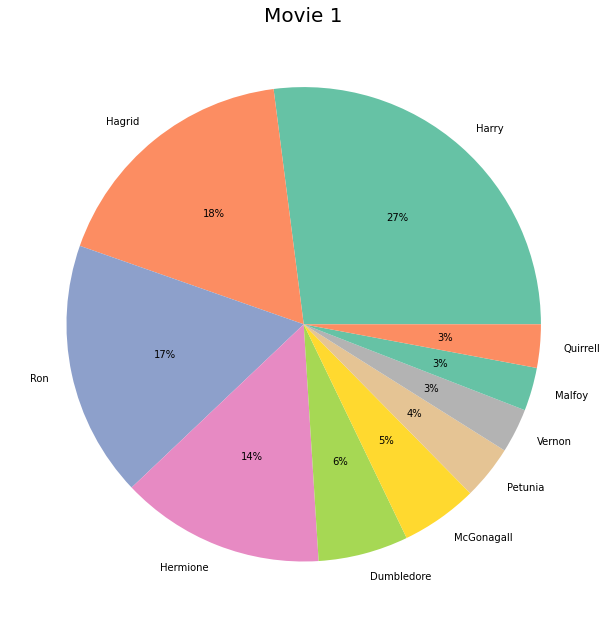

In [37]:
#Characters with the most sentences, top 15 three movies 
#MOVIE 1
movie1 = pd.read_csv('HP1.csv',delimiter=';', encoding = "ISO-8859-1")
movie1.columns = ['Character','Sentence']
movie1
movie1 = movie1.Character

movie1 = movie1.str.split(' ').str.get(0)
movie1_ct = []
for i in movie1:
    movie1_ct.append(i)
mv1 = pd.DataFrame(movie1_ct) 
mv1.columns = ["Character"]
mv1 = mv1.groupby(['Character'])['Character'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False)
mv1 = mv1.reset_index()
mv1 = mv1.drop(columns=['index'])
mv1 = mv1.head(10)

fig = plt.figure(figsize=(24,24))
axes1 = plt.subplot(2,2,1)
axes1 = plt.pie(mv1['Count'],labels = mv1['Character'].unique(),autopct="%.0f%%",colors=sns.color_palette("Set2"))
plt.title('Movie 1',fontsize=20)

Text(0.5, 1.0, 'Movie 2')

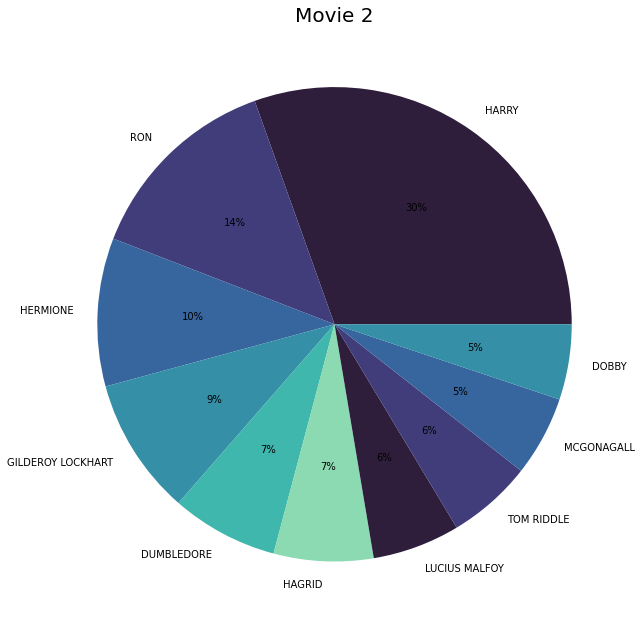

In [38]:
#Characters with the most sentences, top 15 three movies 
#MOVIE 2
movie2 = pd.read_csv('HP2.csv',delimiter=';', encoding = "ISO-8859-1")
movie2.columns = ['Character','Sentence']
movie2 = movie2.Character
movie2_ct = []
for i in movie2:
    movie2_ct.append(i)
mv2 = pd.DataFrame(movie2_ct) 
mv2.columns = ["Character"]
mv2 = mv2.groupby(['Character'])['Character'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False)
mv2 = mv2.reset_index()
mv2 = mv2.drop(columns=['index'])
mv2 = mv2.head(10)
fig = plt.figure(figsize=(24,24))
axes1 = plt.subplot(2,2,1)
axes1 = plt.pie(mv2['Count'],labels = mv2['Character'].unique(),autopct="%.0f%%",colors=sns.color_palette("mako"))
plt.title('Movie 2',fontsize=20)

Text(0.5, 1.0, 'Movie 3')

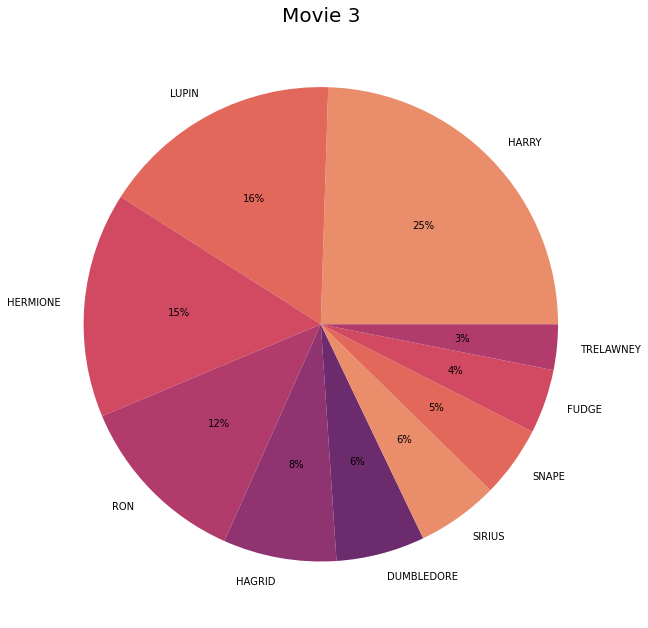

In [39]:
#Characters with the most sentences, top 15 three movies 
#MOVIE 3
movie3 = pd.read_csv('HP3.csv',delimiter=';', encoding = "ISO-8859-1")
movie3.columns = ['Character','Sentence']
movie3 = movie3.Character
movie3_ct = []
for i in movie3:
    movie3_ct.append(i)
mv3 = pd.DataFrame(movie3_ct) 
mv3.columns = ["Character"]
mv3 = mv3.groupby(['Character'])['Character'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False)
mv3 = mv3.reset_index()
mv3 = mv3.drop(columns=['index'])
mv3 = mv3.head(10)
fig = plt.figure(figsize=(24,24))
axes1 = plt.subplot(2,2,1)
axes1 = plt.pie(mv3['Count'],labels = mv3['Character'].unique(),autopct="%.0f%%",colors=sns.color_palette("flare"))
plt.title('Movie 3',fontsize=20)

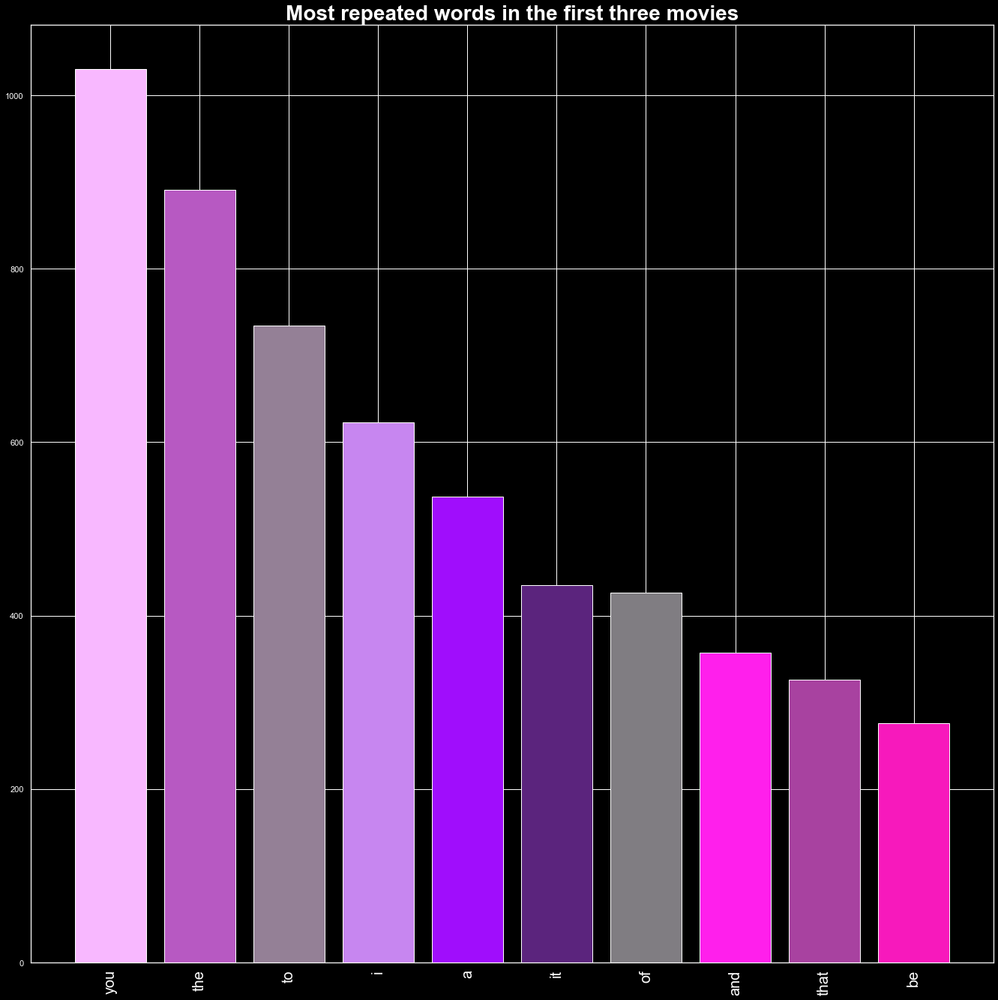

In [142]:
#Most popular words top 15
movie1 = pd.read_csv('HP1.csv',delimiter=';', encoding = "ISO-8859-1")
movie2 = pd.read_csv('HP2.csv',delimiter=';', encoding = "ISO-8859-1")
movie3 = pd.read_csv('HP3.csv',delimiter=';', encoding = "ISO-8859-1")
movie1.columns = ['Character','Sentence']
movie2.columns = ['Character','Sentence']
movie3.columns = ['Character','Sentence']
colors1 = ["#f8b8ff","#b759c2","#948096","#c786f0","#a00dfc", "#5b247d", "#807d82", "#ff1fec", "#a842a0", "#f719bc"]
colors2 = ["#c8815e","#583730","#765c9b", "#cf96b6", "#eb9677", "#cf96b6", "#44606b", "#ffe210", "#9f3b47", "#023b4c"]
colors3 = ["#8e3553","#d5b27a","#623549", "#dc97ce", "#d60257", "#edd4be", "#54626b", "#b2c4b8", "#993652", "#dfbc96"]
colors4 = ["#4975bc","#2aade5","#e4eff5","#3f4263","#c69556", "#dee5eb", "#99dee9","#8c2224","#2e2528","#5898bb"]
script = ""
mv1 = ""
mv2 = ""
mv3 = ""
for i in movie1.Sentence:
    script += i.lower()
    mv1 += i.lower()
for i in movie2.Sentence:
    script += i.lower()
    mv2 += i.lower()
for i in movie3.Sentence:
    script += i.lower()
    mv3 += i.lower()
    
def graph_words(script, title, colors): 
    script = script.replace("."," ",10000)
    script = script.replace(","," ",10000)
    script = script.replace("?"," ",10000)
    script.replace("!"," ",10000)
    script = script.split(" ")
    for i in script:
        if i == "":
            script.remove(i)
        
    words = pd.DataFrame(script) 
    words.columns = ['Word']
    words = words.groupby(['Word'])['Word'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False)
    words = words.head(10)
    
    fig = plt.plot()
#     plt.style.use('dark_background')
    plt.bar(x=words['Word'],height=words['Count'],
        color=colors)
    plt.title(title,fontsize=28,fontweight="bold")
    plt.xticks(rotation=90,fontsize=20);
#     return words

graph_words(script, "Most repeated words in the first three movies", colors1)


# words = format_words(script)
# mv1 = format_words(mv1)
# mv2 = format_words(mv2)
# mv3 = format_words(mv3)





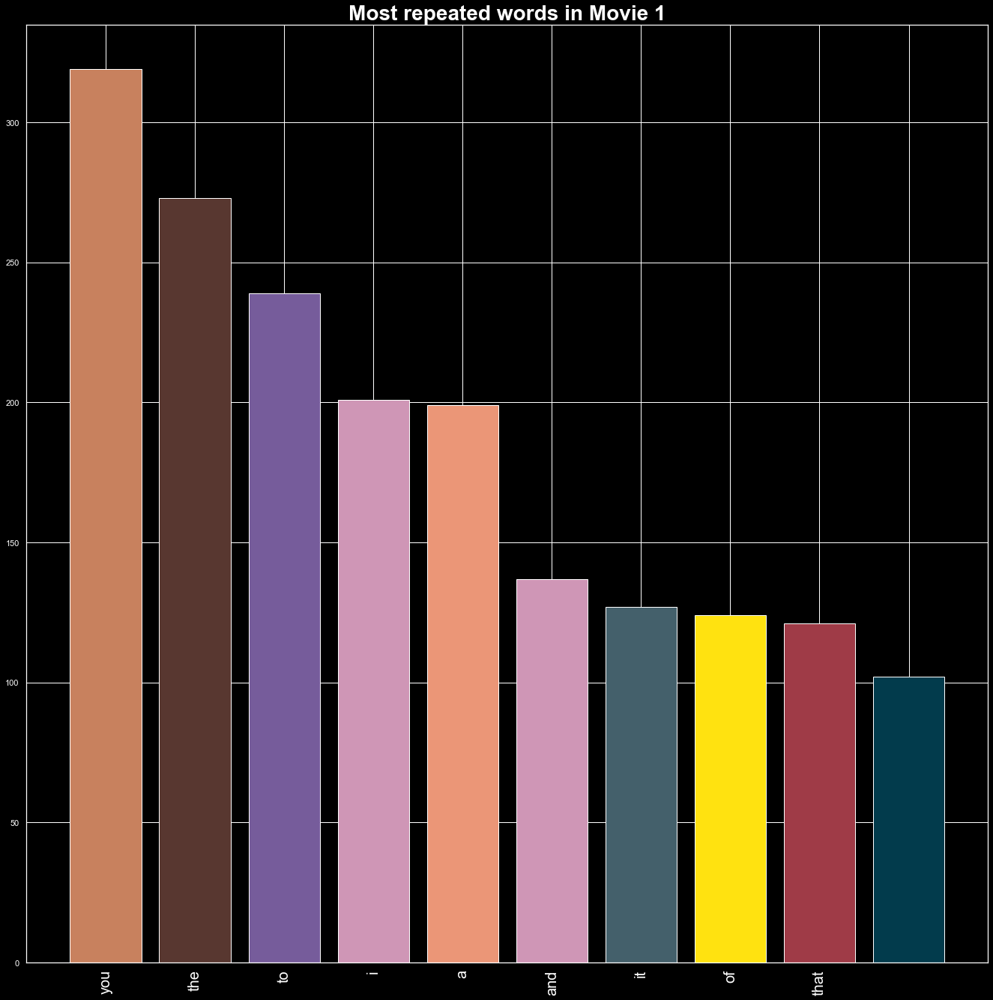

In [143]:
graph_words(mv1, "Most repeated words in Movie 1", colors2)


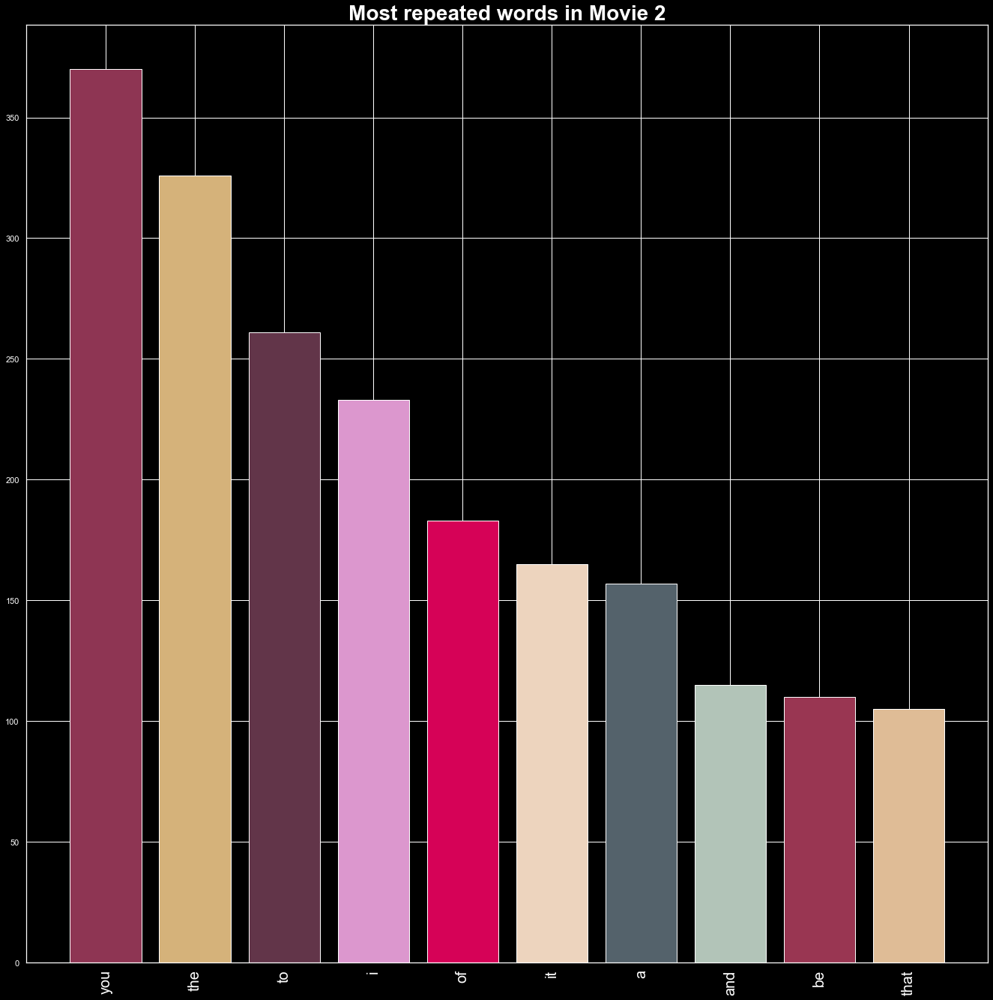

In [144]:
graph_words(mv2, "Most repeated words in Movie 2", colors3)


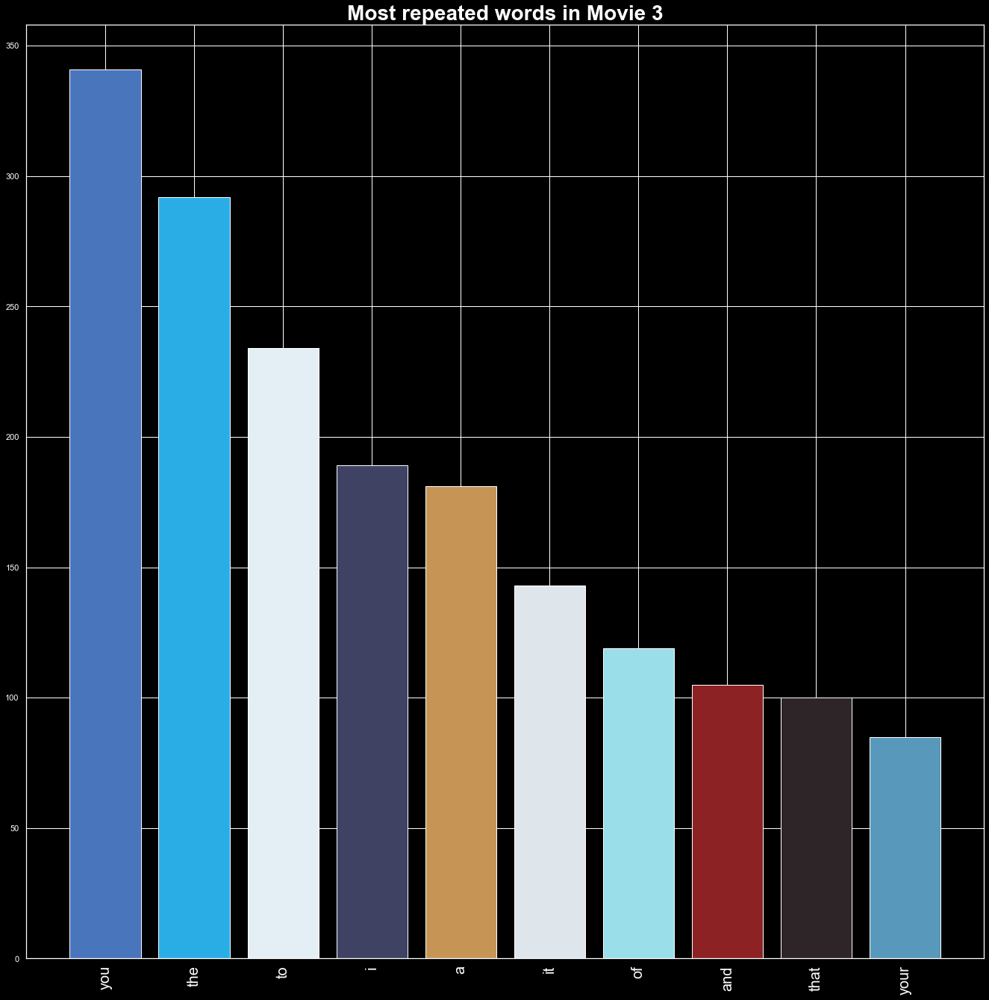

In [145]:
graph_words(mv3, "Most repeated words in Movie 3", colors4)

In [36]:
#Most popular bigrams top 15 

In [37]:
#most popular trigrams top 15

# Reviews 

In [38]:
reviews.head()

,Unnamed: 0,book,name,date,rating,likes,description,stars_given
0,0,Harry Potter and the Sorcerer's Stone,MirandaReads,"Nov11,2019",itwasamazing,1657 likes,Stuck at home? Got some time on your hands? Wa...,5.0
1,1,Harry Potter and the Sorcerer's Stone,Kai,"Apr02,2015",NaN,993 likes,Let's do this thing where we promote and recom...,NaN
2,2,Harry Potter and the Sorcerer's Stone,Lora,"Jun03,2011",itwasamazing,1599 likes,I'm going to keep this brief since there isn't...,5.0
3,3,Harry Potter and the Sorcerer's Stone,★Jess,"Dec10,2009",itwasamazing,831 likes,My original review was a comparison of sorts b...,5.0
4,4,Harry Potter and the Sorcerer's Stone,Matthew,"Jan08,2013",itwasamazing,911 likes,One of my first jobs was at a bookstore. When ...,5.0


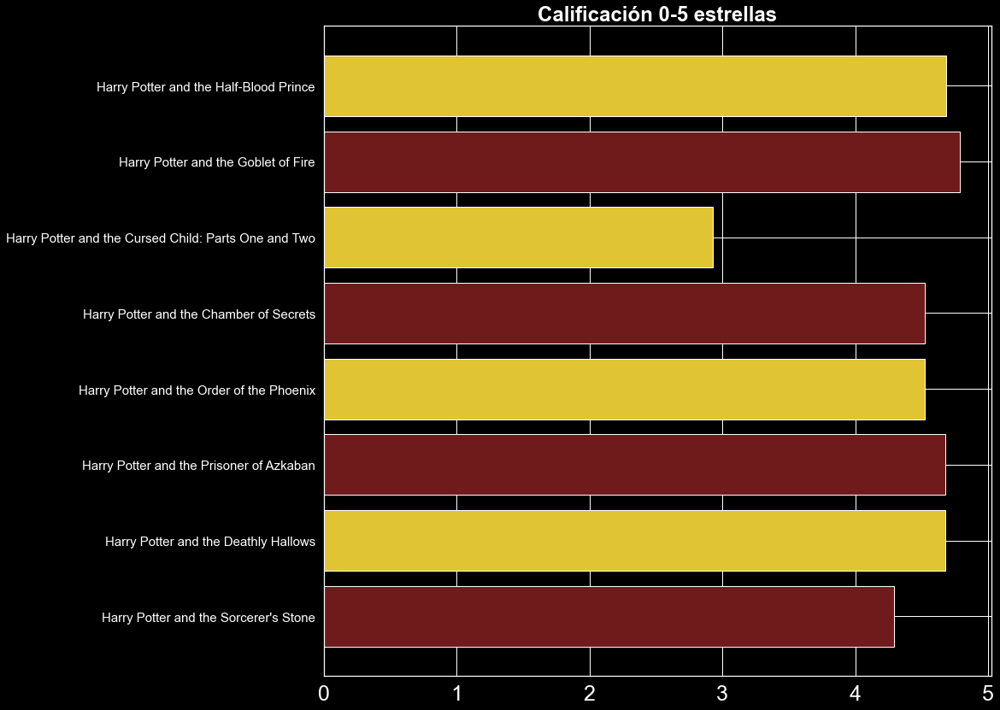

In [39]:

#Calificacion promedio por libro
books=reviews['book'].unique()
rate=[]
# (reviews.loc[reviews['book']=="Harry Potter and the Sorcerer's Stone"])['stars_given'].mean()
for i in books:
    rate.append((reviews.loc[reviews['book']==i])['stars_given'].mean())

fig=plt.plot()
y_pos = np.arange(len(books))
plt.barh(y=books,width=rate,color=["#701b1b","#e0c434","#701b1b","#e0c434","#701b1b","#e0c434","#701b1b","#e0c434"])
plt.xticks(fontsize=25)
plt.yticks(fontsize=15)
plt.title("Calificación 0-5 estrellas",fontsize=24,fontweight="bold")
plt.show()

In [40]:
#Ranking 
books_rating={}
for i in range(len(books)):
    books_rating[books[i]]=rate[i]
books_rating=sorted(books_rating.items(),key=lambda x:x[1],reverse=True)
books_rating
print("HARRY POTTER BOOKS RANKING")
for i in range(len(books_rating)):
    print('{}. {}--Rate: {}'.format(i+1,books_rating[i][0],round(books_rating[i][1],2)))
    

HARRY POTTER BOOKS RANKING
1. Harry Potter and the Goblet of Fire--Rate: 4.78
2. Harry Potter and the Half-Blood Prince--Rate: 4.69
3. Harry Potter and the Deathly Hallows--Rate: 4.68
4. Harry Potter and the Prisoner of Azkaban--Rate: 4.68
5. Harry Potter and the Order of the Phoenix--Rate: 4.52
6. Harry Potter and the Chamber of Secrets--Rate: 4.52
7. Harry Potter and the Sorcerer's Stone--Rate: 4.29
8. Harry Potter and the Cursed Child: Parts One and Two--Rate: 2.93


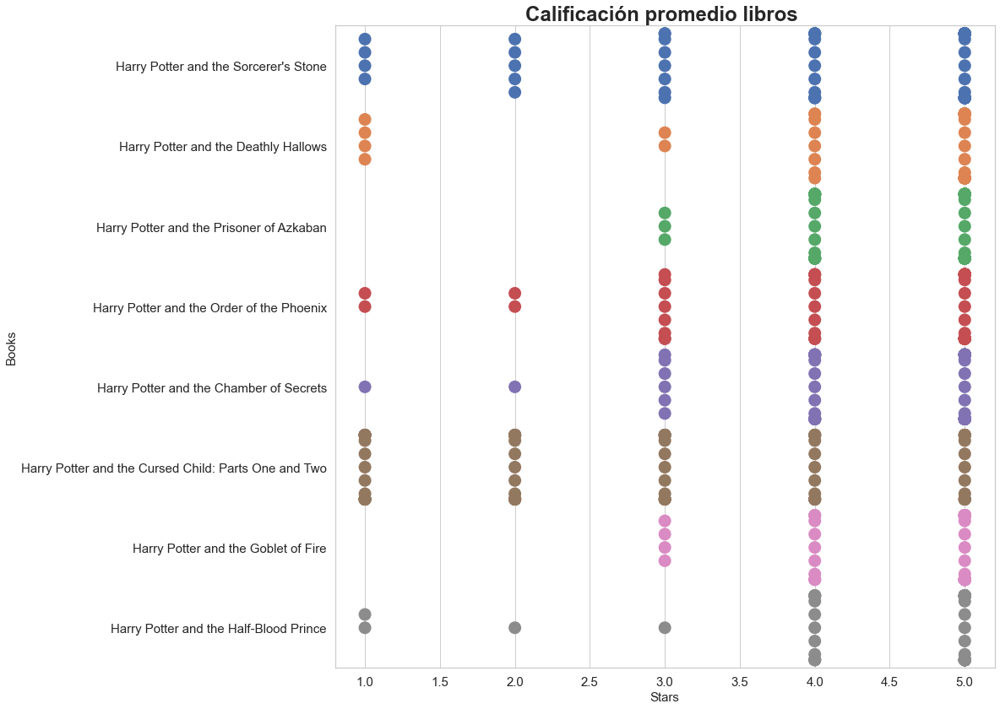

In [41]:
import warnings
warnings.filterwarnings("ignore") 
#Dispersion rating
sns.set(style="whitegrid")
ax = sns.swarmplot(x='stars_given',y='book',data=reviews,s=15)
plt.title('Calificación promedio libros ',fontsize=24,fontweight="bold")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Stars",fontsize=15)
plt.ylabel("Books",fontsize=15)
plt.show();

In [42]:
#Most liked best rate
# reviews['likes']=reviews['likes'].apply(lambda str:str.replace('likes',''))

best_rates=reviews.loc[reviews['stars_given']==5]

x=best_rates.loc[best_rates['likes']==best_rates['likes'].max()]
print(x['book'])
list(x['description'])

520    Harry Potter and the Cursed Child: Parts One a...
Name: book, dtype: object


['"Hogwarts is a big place.""Big. Wonderful. Full of food. I\'d give anything to be going back."   MY HEART   EXCUSE ME WHILE I SOB  *rolls around in feels.*Okay okay.*deeps breaths*First of all: THIS IS A SCRIPT! It\'s mostly dialogue and it\'s fairly short with just 308 pages and its VERY quick to read. I went to the midnight release, had some butter beer, sang happy birthday to Harry, and counted down to midnight then proceeded to sit there and completely DEVOUR the book. I sat there and just R\n  "Hogwarts is a big place.""Big. Wonderful. Full of food. I\'d give anything to be going back."   MY HEART   EXCUSE ME WHILE I SOB  *rolls around in feels.*Okay okay.*deeps breaths*First of all: THIS IS A SCRIPT! It\'s mostly dialogue and it\'s fairly short with just 308 pages and its VERY quick to read. I went to the midnight release, had some butter beer, sang happy birthday to Harry, and counted down to midnight then proceeded to sit there and completely DEVOUR the book. I sat there and 

In [43]:
#Most liked worst rate
best_rates=reviews.loc[reviews['stars_given']==1]

x=best_rates.loc[best_rates['likes']==best_rates['likes'].max()]
print(x['book'])
list(x['description'])

521    Harry Potter and the Cursed Child: Parts One a...
Name: book, dtype: object


["I can't even pretend like I enjoyed this. The dialogue was terrible, the scenes were awkward, previous characterization was ignored, and the plot was downright weird.I'm afraid with a series like Harry Potter this sort of unnecessary sequel tangent is just entirely unadvisable. It feels to me like this play very much wanted to occupy the same category as the play Wicked - a reworking/exploring of existing characters without creating something canonically accurate. But where Wicked succeeded with\nI can't even pretend like I enjoyed this. The dialogue was terrible, the scenes were awkward, previous characterization was ignored, and the plot was downright weird.I'm afraid with a series like Harry Potter this sort of unnecessary sequel tangent is just entirely unadvisable. It feels to me like this play very much wanted to occupy the same category as the play Wicked - a reworking/exploring of existing characters without creating something canonically accurate. But where Wicked succeeded 

# Horrocruxes

In [44]:
horrocruxes.head(10)

,id,killer,horrocrux,weapon,hiding place,soul porcentage
0,1,Harry Potter,Tom Riddle's Diary,basilisk's fang,Malfoy Manor,50.0
1,2,Albus Dumbledore,Marvolo Gaunt's Ring,Sword of Gryffindor,Gaunt Shack,25.0
2,3,Ron Weasley,Slytherin's Locket,Sword of Gryffindor,The Cave,12.5
3,4,Hermione Granger,Helga Hufflepuff's cup,basilisk's fang,Lestrange Vault,6.2
4,5,Vincent Crabbe,Rowena Ravenclaw's diadem,Fiendfyre,Room of Requirement,3.1
5,6,Voldemort,Harry Potter,Avada Kedavra,Harry Potter,1.5
6,7,Neville Longbottom,Nagini,Sword of Gryffindor,Protection orb,0.7
7,8,Harry Potter,Voldemort,Avada Kedavra,Voldemort,0.7


In [146]:
fig = px.bar(horrocruxes[['horrocrux','killer','soul porcentage','id']], 
                        y = "soul porcentage", x= "horrocrux", color='killer',template='plotly_white')
fig.update_xaxes(tickangle=270, tickfont=dict(family='Rockwell', size=14))
fig.update_layout(title_text="Horrocruxes")
fig.show()

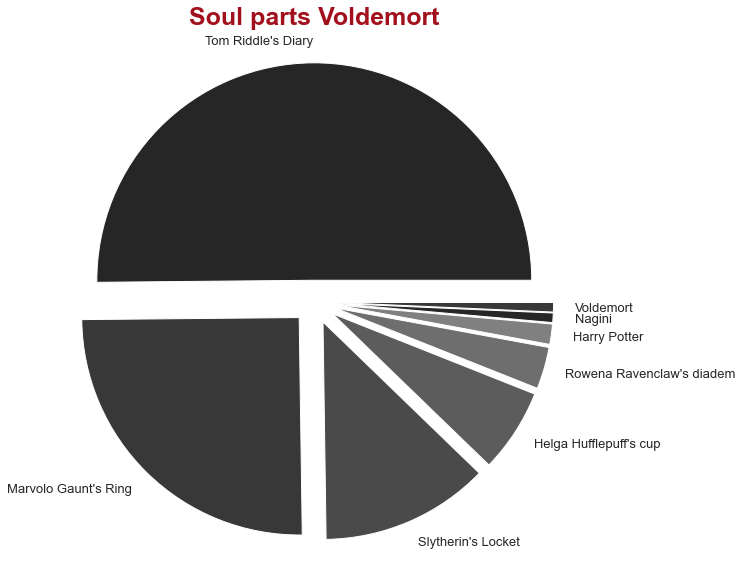

In [46]:
#Soul porcentage 
fig = plt.figure(figsize=(10,10))
axes1 = plt.plot(2,2,1)
axes1 = plt.pie(horrocruxes['soul porcentage'],labels = horrocruxes['horrocrux'],colors=sns.color_palette("dark:grey"),textprops={'fontsize': 13} ,explode=(0.1, 0.1, 0.1, 0.1,0.1,0.1,0.1,0.1))

plt.title('Soul parts Voldemort',fontsize=25,fontweight='bold',color='#a3101d');



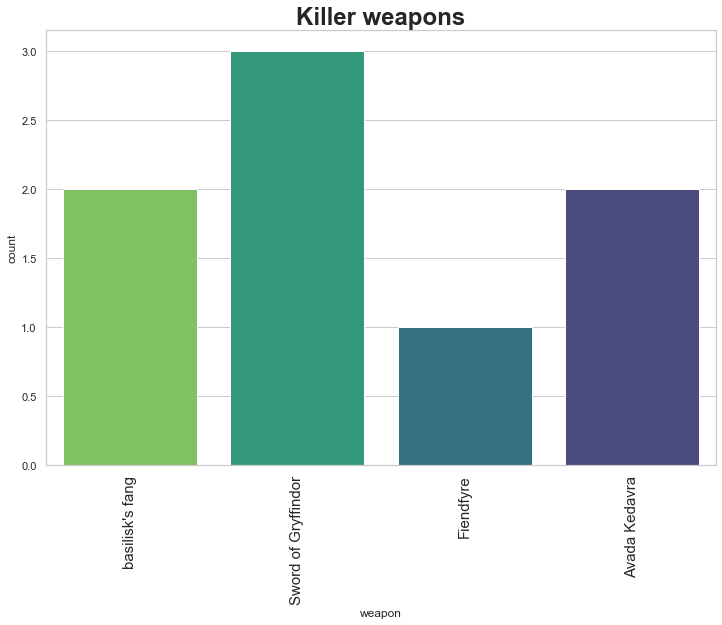

In [47]:
fig = plt.figure(figsize=(12,8))
axes = plt.plot()
axes =  sns.countplot(x='weapon',data=horrocruxes,palette="viridis_r")
axes.set_title('Killer weapons',fontsize=24,fontweight='bold')
plt.xticks(rotation=90,fontsize=15);

# Mapa